# Import packages

In [1]:
"""pip install pciSeq
pip install pciSeq
pip install matplotlib
pip install cellpose
pip install scanpy
pip install torch
pip install tangram
pip install squidpy
pip install seaborn
pip install anndata"""

'pip install pciSeq\npip install pciSeq\npip install matplotlib\npip install cellpose\npip install scanpy\npip install torch\npip install tangram\npip install squidpy\npip install seaborn\npip install anndata'

In [1]:
pip install importlib-metadata

Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
import numpy as np
import pandas as pd
import skimage.color
import matplotlib.pyplot as plt
from scipy.sparse import load_npz, coo_matrix
import pciSeq
import matplotlib


DIPlib -- a quantitative image analysis library
Version 3.4.0 (Dec  8 2022)
For more information see https://diplib.org


In [2]:
#from cellpose import plot, utils
from PIL import Image
import re
import scanpy as sc
import torch
import tangram as tg
import squidpy as sq
import seaborn as sns
import anndata as ad
from anndata import AnnData

## Path setting

Here I define the paths and load the data.
Change this according to your folders.

In [3]:
#Path to the folder with the Cartana reads
#general_read_path="/Users/Jifi/Documents/Spagnoli Lab/Experiences/Cartana/DATA/Reads/HighThreshold"

#Path to the folder with the low threshold Cartana reads
#path_lowreads="C:/Users/atorr/Documents/Postdoc/CARTANA/Cartana/Reads/Low"

#Path to the folder with the high threshold Cartana reads
#path_highreads="C:/Users/atorr/Documents/Postdoc/CARTANA/Cartana/Reads/High"

#Path to the folder with the Cartana reads (here just high, not combined with low reads)
combined_reads_path="C:/Users/atorr/Desktop/CartanaJF/DATA/Reads/HighThreshold"


#Path to the folder to store the reads of the subsetted pancreatic cells. Create this folder in the Reads folder
path_masked_reads="C:/Users/atorr/Desktop/CartanaJF/DATA/Reads/Masked_reads"

############################################################################################################################
#Path to the single-cell matrix csv
path_singlecell="C:/Users/atorr/Desktop/CartanaJF/Alejo Pipeline/CartanaJF_singlecell_df.txt"

#Path to the single-cell metadata matrix csv
path_singlecell_meta="C:/Users/atorr/Desktop/CartanaJF/Alejo Pipeline/CartanaJF_singlecell_meta_df.txt"


############################################################################################################################
#Path to the folder with the black and white masks used to filter out non pancreatic tissue
path_masks="C:/Users/atorr/Desktop/CartanaJF/DATA/Images/Mask Pancreas"

############################################################################################################################

#Path to Cellpose npy files:
Cellpose_files_path="C:/Users/atorr/Desktop/CartanaJF/DATA/Images/Cellpose masks"

#########################################################################################################################

#Path to Output folder. (Create a folder with this folders inside:Cellpose_masks, Anndata_pciseq_objects, Tangram_probabilities, Tangram_annotation, Individual_neigh, Anndata_Tangram_objects) 
path_Outputs="C:/Users/atorr/Desktop/CartanaJF/Alejo Pipeline/Outputs_segmentation"

# Reads file creation

Here I generate the final reads file combining the reads from the genes coming from either the low-threshold or the high threshold files.
Then I filter the results to obtain only those reads contained in the masks drawn manually.
Ignore this part if all your reads come from either the low or the high threshold reads

### 1) Combine reads from high and low threshold

You can ignore this cell if all your genes come from either the low or the high threshold files. 

### 2) Filter out non-pancreatic reads

The next cell subsets reads included only in pancreatic cells based on the black-white masks we manually draw using imageJ.

It will also save a csv file with the subseted reads in the directory you want.

In [382]:
Sample="reads_E14.5_1_HighThreshold_ISAP02045519_20220407"
Sample1="E14.5_1_8bit"
Directory=combined_reads_path

combined_df_list=os.listdir(combined_reads_path)#In case your reads come from low or high threshold, substitute the path for the adequate one

mask_images=os.listdir(path_masks)

combined_df = pd.read_csv("{}/{}.csv".format(combined_reads_path, Sample), sep=",")
combined_df=combined_df.dropna()
mask=Image.open('{}/{}.tif'.format(path_masks, Sample1))
maskarray = np.array(mask)

for z in range(len(combined_df)):
                x_pos=int(combined_df.loc[z,"X"])
                y_pos=int(combined_df.loc[z,"Y"])
                if maskarray[y_pos, x_pos]==0:
                    combined_df = combined_df.drop(z)
                    combined_df.to_csv("{}/{}_masked.csv".format(path_masked_reads, Sample), sep=",", index=False)

# Here I start the actual pciSeq protocol

### 1) First we load the single-cell data

There are two parameters to change in the first cell:
1) Select the stage for your sample: E12, E14, E17

2) Select the clusters you want to remove from the single-cell data

Very important!!! Run the the next cell only once per stage: Run it for E12 and then run the code for all E12.5 samples. Run again next cell for E14 and run the code for all E14.5 samples...

In [367]:
##############################







#Load the single cell dataset and the metadata containing cell labels
scRNA_df = pd.read_csv(path_singlecell, sep=" ", index_col=0)
scRNA_df.columns=scRNA_df.columns.str.split('.').str[0]
scRNA_meta_df = pd.read_csv(path_singlecell_meta, sep=" ")

#Here I subset the cells belonging to a particular stage. This is important, as pciSeq and Tangram take into account the cellular proportions to map the cells
scRNA_df=scRNA_df.transpose()
#Here change stage
scRNA_df=scRNA_df[scRNA_meta_df["orig.ident"]=="E14"]#Modify this!!!

#Here filter out unwanted clusters (Remove the next two lines if you want to include all the clusters)
scRNA_df=scRNA_df[(scRNA_meta_df["active.ident"]!="Blood cells")]
scRNA_meta_df2=scRNA_meta_df[scRNA_meta_df["active.ident"]!="Blood cells"]
#scRNA_meta_df2=scRNA_meta_df
scRNA_meta_df2.replace(["T-Cell", "B-Cells", "Granulocytes", "Macrophages"], "Immune", inplace=True)

scRNA_df=scRNA_df.transpose()
scRNA_df2=scRNA_df.rename(columns=scRNA_meta_df2["active.ident"])


scdata=sc.AnnData(scRNA_df.transpose())
scdata.obs["cluster_label"]=scRNA_df2.columns
scdata.var.index=scRNA_df.index
sc.pp.normalize_total(scdata)


normalizing counts per cell
    finished (0:00:00)


### 2) Loading of segmentations.

Here I load the Cellpose segmented files anf filter out non pancreatic cells.

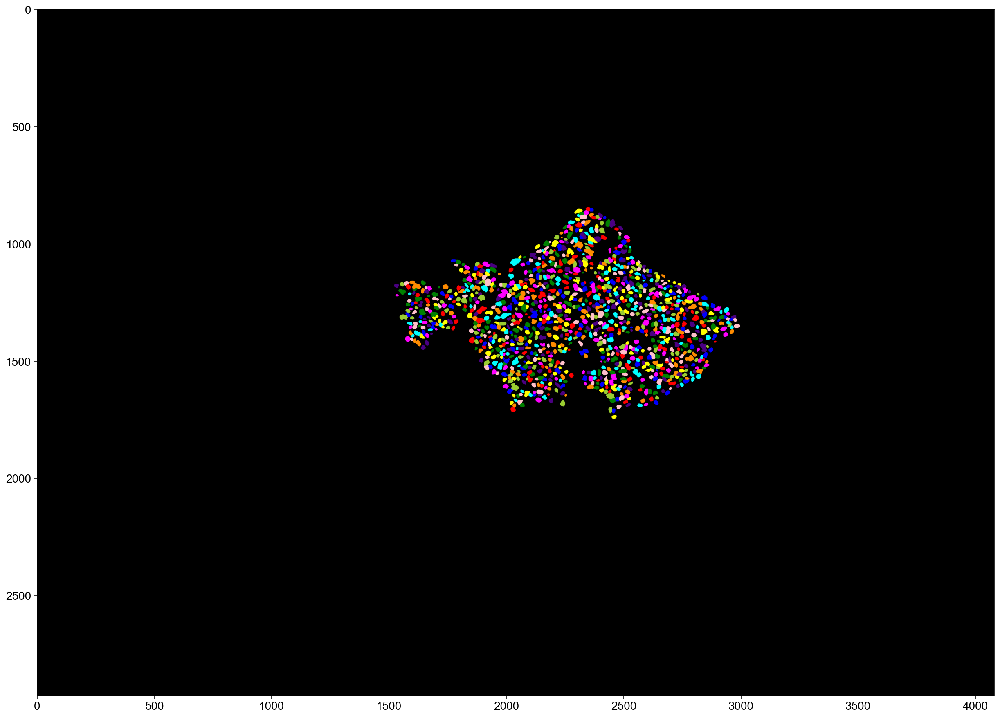

In [504]:
#This cell will open a cellpose file and save an image of the masks

Sample="E14.5_9" #Modify this!!

Cellpose_file = [filename for filename in os.listdir(Cellpose_files_path) if filename.startswith("DAPI_{}_".format(Sample))][0]

dat = np.load("{}/{}".format(Cellpose_files_path,Cellpose_file), allow_pickle=True).item()
label_image=dat['masks']


mask_images=os.listdir(path_masks)
mask=Image.open('{}/{}_8bit.tif'.format(path_masks, Sample))
maskarray = np.array(mask)

from skimage.measure import regionprops
props = regionprops(label_image)


for z in props:
    x_pos=int(z['centroid'][0])
    y_pos=int(z['centroid'][1])
    coords=z["coords"]
    if maskarray[x_pos, y_pos]==0:
        for n in coords:
            label_image[n[0]][n[1]]=0
        

label_image1=coo_matrix(label_image)


rgb_label_image = skimage.color.label2rgb(label_image1.toarray(), bg_label=0)
_dpi = 72
plt.figure(figsize=(1500/_dpi, 1500/_dpi), dpi=_dpi)
imgplot = plt.imshow(rgb_label_image)
plt.grid(False)
plt.savefig('{}/Cellpose_Masks/{}.tif'.format(path_Outputs, Sample))
plt.show()

### 3) Load the ISS reads of your sample

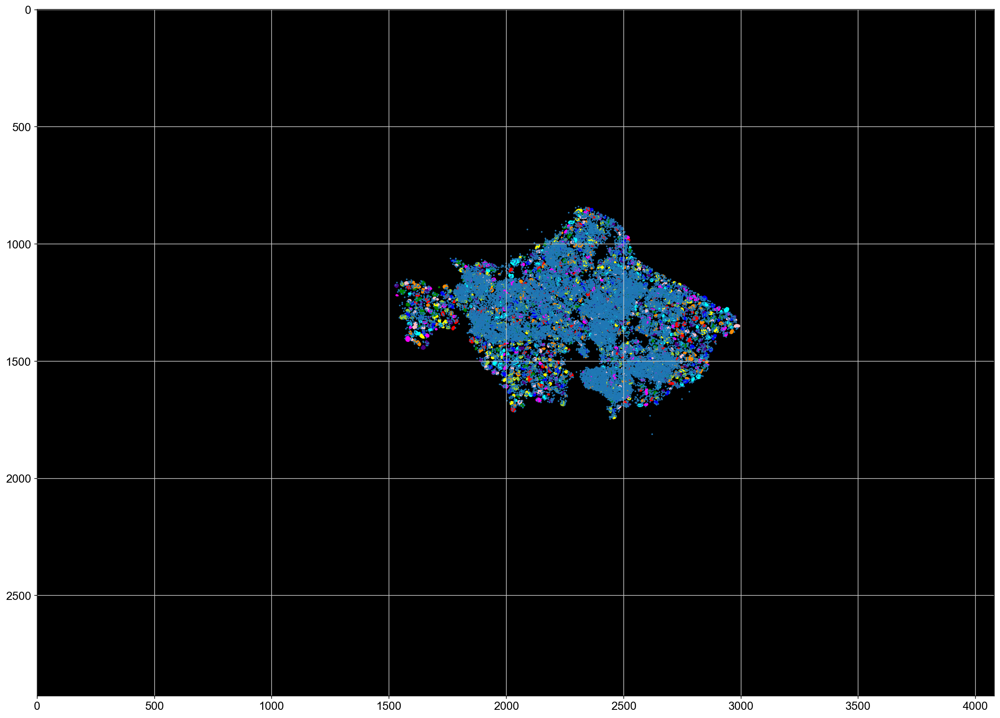

In [505]:
Sample="E14.5_9"
spots_df = pd.read_csv("{}/{}_masked.csv".format(path_masked_reads,Sample), sep=",")
spots_df = spots_df.rename(columns={'gene': 'Gene'})
spots_df = spots_df.rename(columns={'X': 'x'})
spots_df = spots_df.rename(columns={'Y': 'y'})


#This is just to make sure masks and coordinates are overlaped. 
my_dpi = 72
plt.figure(figsize=(1500/my_dpi, 1500/my_dpi), dpi=my_dpi)
imgplot = plt.imshow(rgb_label_image)
plt.scatter(spots_df.x, spots_df.y, s=1)
plt.show()

### 4) Run the pciseq package.
This creates two dataframes. One is the cell dataframe, and the other the gene datframe. If you want to take a look on how they look, you can access them by running res[0] or res[1].


In [506]:
pciSeq.attach_to_log()


opts = { 'save_data': False, 'Inefficiency': 0.02 }
res = pciSeq.fit(spots_df, label_image1, scRNA_df2, opts)

[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09] INFO    (app.py:151)  save_data is set to False
[2024-10-08 18:14:09

[2024-10-08 18:14:09] INFO    (spot_labels.py: 61)  The labels in the label image do not seem to be a sequence of successive integers. Relabelling the label image.
[2024-10-08 18:14:09] INFO    (spot_labels.py: 61)  The labels in the label image do not seem to be a sequence of successive integers. Relabelling the label image.
[2024-10-08 18:14:09] INFO    (spot_labels.py: 61)  The labels in the label image do not seem to be a sequence of successive integers. Relabelling the label image.
[2024-10-08 18:14:09] INFO    (spot_labels.py: 61)  The labels in the label image do not seem to be a sequence of successive integers. Relabelling the label image.
[2024-10-08 18:14:09] INFO    (spot_labels.py: 61)  The labels in the label image do not seem to be a sequence of successive integers. Relabelling the label image.
[2024-10-08 18:14:09] INFO    (spot_labels.py: 61)  The labels in the label image do not seem to be a sequence of successive integers. Relabelling the label image.
[2024-10-08 18:1

[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and height: 2928px
[2024-10-08 18:14:09] INFO    (spot_labels.py: 66)  Segmentation array implies that image has width: 4080px and

[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene panel of 50 only
[2024-10-08 18:14:11] INFO    (datatypes.py:388)  Single cell data: Keeping counts for the gene 

[2024-10-08 18:14:11] INFO    (datatypes.py:402)  Grouped single cell data have 50 genes and 10 cell types
[2024-10-08 18:14:11] INFO    (datatypes.py:402)  Grouped single cell data have 50 genes and 10 cell types
[2024-10-08 18:14:11] INFO    (datatypes.py:402)  Grouped single cell data have 50 genes and 10 cell types
INFO:pciSeq: Grouped single cell data have 50 genes and 10 cell types
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start cell typing
[2024-10-08 18:14:11] INFO    (app.py: 96)  Start c

[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0.634460
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 2, mean prob change 0

[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 5, mean prob change 0.420088
INFO:pciSeq: Iteration 5, mean prob change 0.420088
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 6, mean prob change 0.396776
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 6, mean prob change 0.396776
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 6, mean prob change 0.396776
[2024-10-08 18:14:12] IN

[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0.239698
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 9, mean prob change 0

[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean prob change 0.272606
[2024-10-08 18:14:12] INFO    (main.py: 59)  Iteration 12, mean p

[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean prob change 0.317613
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 15, mean p

[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 18, mean prob change 0.120172
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 18, mean prob change 0.120172
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 18, mean prob change 0.120172
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 18, mean prob change 0.120172
INFO:pciSeq: Iteration 18, mean prob change 0.120172
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 19, mean prob change 0.146464
[2024-10-08 

[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean prob change 0.249059
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 22, mean p

[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean prob change 0.262241
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 25, mean p

[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:13] INFO    (main.py: 59)  Iteration 28, mean prob change 0.104905
INFO:pciSeq: Iteration 28, mean prob change 0.104905
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 29, mean prob change 0.115433
[2024-10-08 

[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 31, mean prob change 0.184216
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 31, mean prob change 0.184216
INFO:pciSeq: Iteration 31, mean prob change 0.184216
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 32, mean prob change 0.084076
[2024-10-08 

[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean prob change 0.257315
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 35, mean p

[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean prob change 0.106582
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 38, mean p

[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 41, mean prob change 0.031156
INFO:pciSeq: Iteration 41, mean prob change 0.031156
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 42, mean prob change 0.009833
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 42, mean prob change 0.009833
[2024-10-08 18:14:14] INFO    (main.py: 59)  Iteration 42, mean prob change 0.009833
[2024-10-08 

[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
[2024-10-08 18:14:16] INFO    (app.py: 89)  Done
INFO:pciSeq: Done


# Here I apply Tangram to map single-cell data to spatial data

### 1) Transform pciseq results to the input of Tangram

In [510]:
#Transform pciSeq results to Anndata format


anndata_test=pd.DataFrame(index=range(len(res[0])),columns=range(50)) #change range () according to error message, depends on Nb type of gene detected in section
anndata_test.columns=res[1].Gene.unique()

for i in range(len(anndata_test.index)):
    for x in anndata_test.columns:
         for z in range(len(res[0].loc[i+1, "Genenames"])):
            if x==res[0].loc[i+1, "Genenames"][z]:
                anndata_test.loc[i,x]=res[0].loc[i+1, "CellGeneCount"][z]

######################################################################################################
                
celltypedf=pd.DataFrame(index=range(len(res[0])), columns=range(1))

######################################################################################################

for i in range(len(anndata_test.index)):
    dict = {}
    for x in range(len(res[0].loc[i+1, "ClassName"])):
        dict[res[0].loc[i+1, "ClassName"][x]]=res[0].loc[i+1, "Prob"][x]
    celltypedf.loc[i, 1]=max(dict, key=dict.get)

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')


anndata_test.fillna(0,inplace=True)
adata = sc.AnnData(anndata_test, 
    anndata_test.index.to_frame(), 
    anndata_test.columns.to_frame())

adata.var_names_make_unique()
spatial_array = res[0][["X", "Y"]].to_numpy()

adata.obsm["spatial"]=spatial_array

adata.obs["y"]=spatial_array[:,1]
adata.obs["x"]=spatial_array[:,0]

adata.obs["celltype"]=celltypedf[1].to_numpy()

adata.obs.drop(0, inplace=True, axis=1)
adata.var.drop(0, inplace=True, axis=1)
results_pciseq_file = '{}/Anndata_pciseq_objects/{}_predicted.h5ad'.format(path_Outputs ,Sample)
sc.pp.normalize_total(adata)

adata.write(results_pciseq_file)

scanpy==1.9.0 anndata==0.8.0 umap==0.5.2 numpy==1.21.6 scipy==1.8.0 pandas==1.5.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6
normalizing counts per cell
    finished (0:00:00)


In [468]:
#adata=adata[(adata.obs['x']>2500) & (adata.obs['y']<5000)]
#adata=adata[(adata.obs['x']>2000)]
#adata=adata[(adata.obs['y']>3000)]
#adata=adata[(adata.obs['x']>3000)]
adata=adata[(adata.obs['x']>5000)]

In [256]:
genes=adata.var.index.to_list()


In [257]:
#genes.remove("chgb")
genes.remove("Chgb")
#genes.remove("Pnliprp1")

### 2) Run the Tangram package. 

INFO:root:48 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:49 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 48 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.125, KL reg: 0.184
Score: 0.477, KL reg: 0.007
Score: 0.477, KL reg: 0.007
Score: 0.478, KL reg: 0.007
Score: 0.478, KL reg: 0.007
Score: 0.478, KL reg: 0.007
Score: 0.478, KL reg: 0.007
Score: 0.478, KL reg: 0.007
Score: 0.478, KL reg: 0.007
Score: 0.478, KL reg: 0.007


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


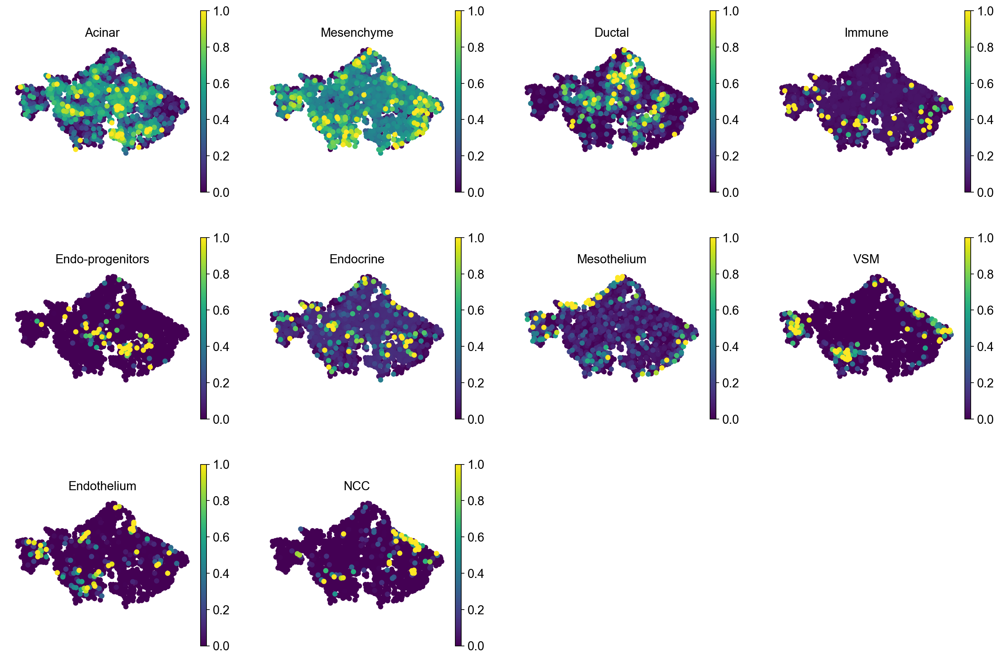

In [511]:
tg.pp_adatas(scdata, adata, genes=genes)
ad_map = tg.map_cells_to_space(scdata,
    adata,
    device='cpu',num_epochs=1000,
    mode='clusters',
    cluster_label="cluster_label", scale=True
    # device='cuda:0',
)
tg.project_cell_annotations(ad_map, adata, annotation="cluster_label")

#############################################################################################################3
annotation_list = list(pd.unique(scdata.obs['cluster_label']))
tg.plot_cell_annotation_sc(adata, annotation_list,perc=0.02, scale_factor=1, spot_size= 45, x='x', y='y')
result = adata.obsm["tangram_ct_pred"].idxmax(axis=1)
adata.obs["Tangram_annotation"]=result.to_numpy()

#plt.savefig('{}/Tangram_probabilities/{}_TangramClusters.tif'.format(path_Outputs, Sample))

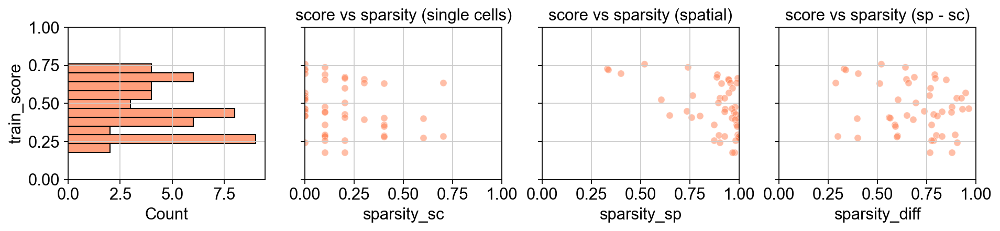

In [389]:
#This cell gives some graphs about the data quality. There's some info about it on the Tangram paper. In my case, it's far from an optimal situation...

tg.plot_training_scores(ad_map, bins=10, alpha=.5)

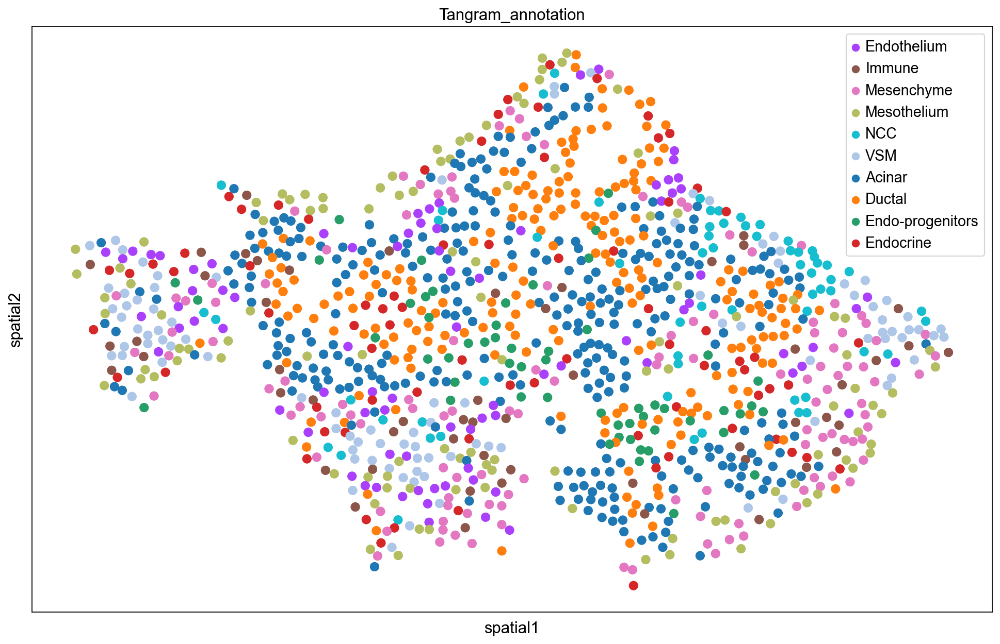

In [512]:
#This cell is just to plot the results.


my_cmap = matplotlib.colors.ListedColormap(sns.color_palette("colorblind", 14).as_hex())
my_cmap2=matplotlib.colors.ListedColormap(["#2ED9FFFF", "#90AD1CFF", "#1CFFCEFF","#16FF32FF", "#5A5156FF", "#E4E1E3FF", "#F6222EFF",
                                           "#C4451CFF", "#FE00FAFF", "#3283FEFF", "#FEAF16FF", "#B00068FF"])
#plt.figure(figsize=(1500/_dpi, 1500/_dpi), dpi=_dpi)


sq.pl.spatial_scatter(adata, color="Tangram_annotation", shape=None, figsize=(12, 12), size=200, spatial_key="spatial")
plt.grid(False)

# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [4, 5, 6, 7, 8,9, 0,1,2,3]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])


plt.savefig('{}/Tangram_annotation/{}_Tangram.tif'.format(path_Outputs, Sample))
plt.show()

In [513]:
adata.obs.groupby(['Tangram_annotation']).size()

Tangram_annotation
Acinar              329
Ductal              212
Endo-progenitors     56
Endocrine            75
Endothelium          84
Immune               54
Mesenchyme          123
Mesothelium         111
NCC                  62
VSM                  97
dtype: int64

Creating graph using `generic` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:01)
Calculating neighborhood enrichment using `1` core(s)


  0%|          | 0/1000 [00:00<?, ?/s]

Adding `adata.uns['Tangram_annotation_nhood_enrichment']`
Finish (0:00:02)


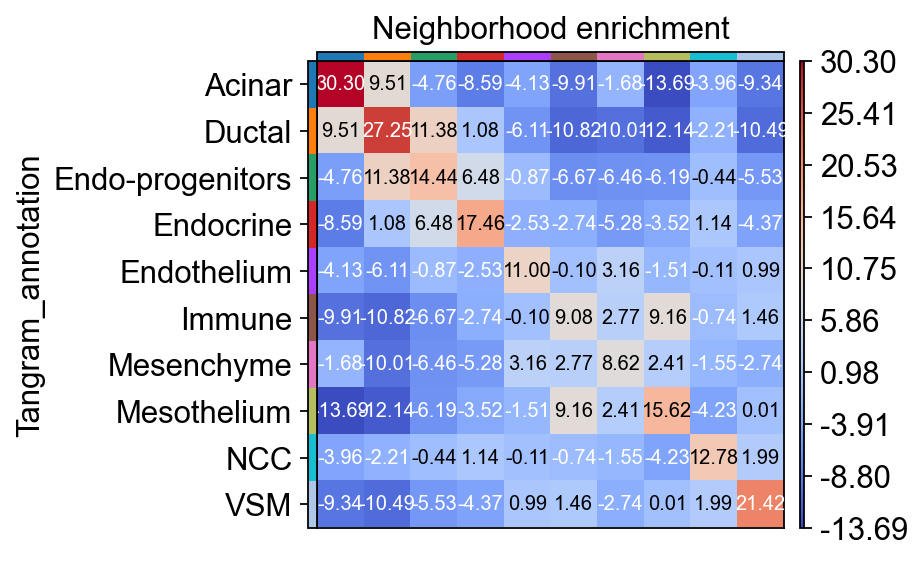

In [314]:
#Plots and saves the neigboughood enrichment

sq.gr.spatial_neighbors(adata, coord_type="generic", radius=200, delaunay=True)
sq.gr.nhood_enrichment(adata, cluster_key="Tangram_annotation")
kwargs={"size":9}
sq.pl.nhood_enrichment(adata, cluster_key="Tangram_annotation", cmap="coolwarm", annotate=True, **kwargs)

plt.tight_layout()
plt.savefig('{}/Individual_neigh/{}_Tangram_Neigbourhood.tif'.format(path_Outputs, Sample))

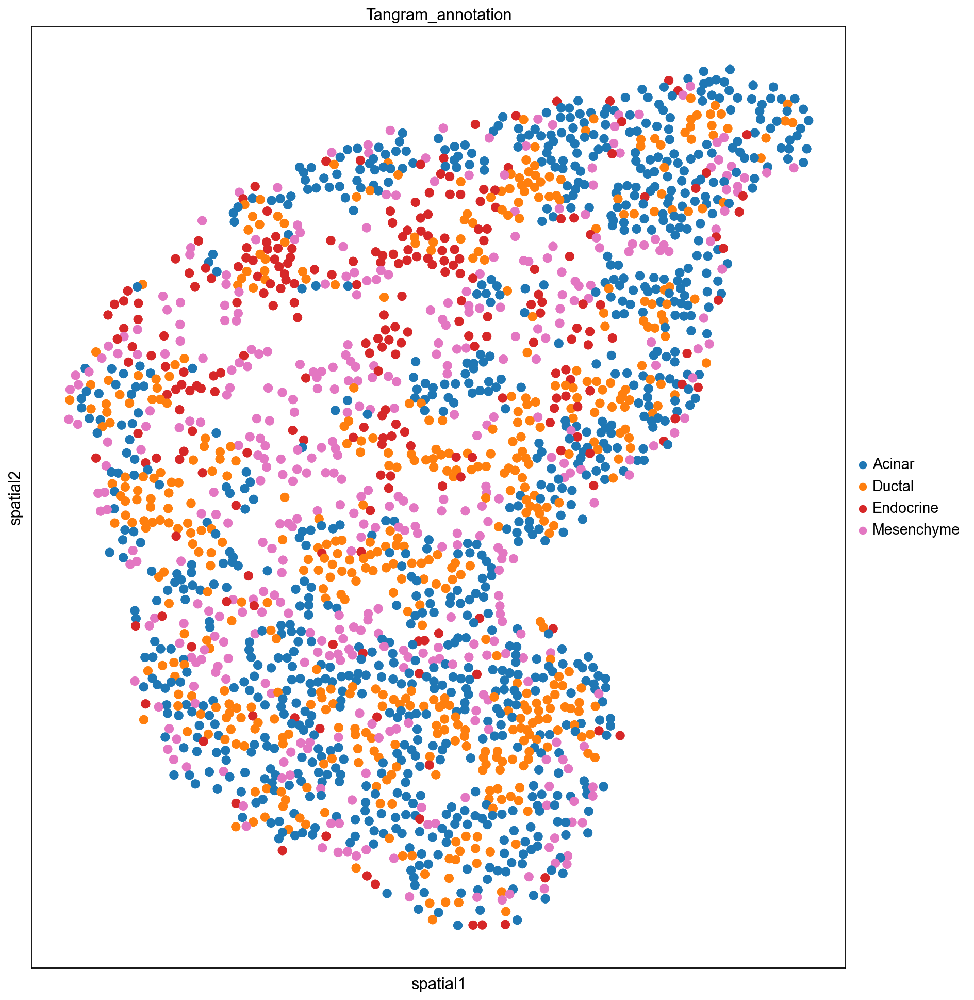

In [488]:
my_cmap3=matplotlib.colors.ListedColormap(["#90AD1CFF", "#2ED9FFFF"])#Here you change the colors of the clusters


sq.pl.spatial_scatter(
    adata,
    color="Tangram_annotation",
    groups=[
       "Endocrine", "Ductal", "Acinar", "Mesenchyme"  #Here you change the clusters you want to plot. 
    ],
    shape=None, figsize=(12, 12),
    size=200
)

plt.savefig('{}/Tangram_annotation/{}_EndoMII.tif'.format(path_Outputs, Sample))#Change the name of the file
plt.show()

Calculating co-occurrence probabilities for `50` intervals `1` split combinations using `1` core(s)


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.uns['Tangram_annotation_co_occurrence']`
Finish (0:00:02)


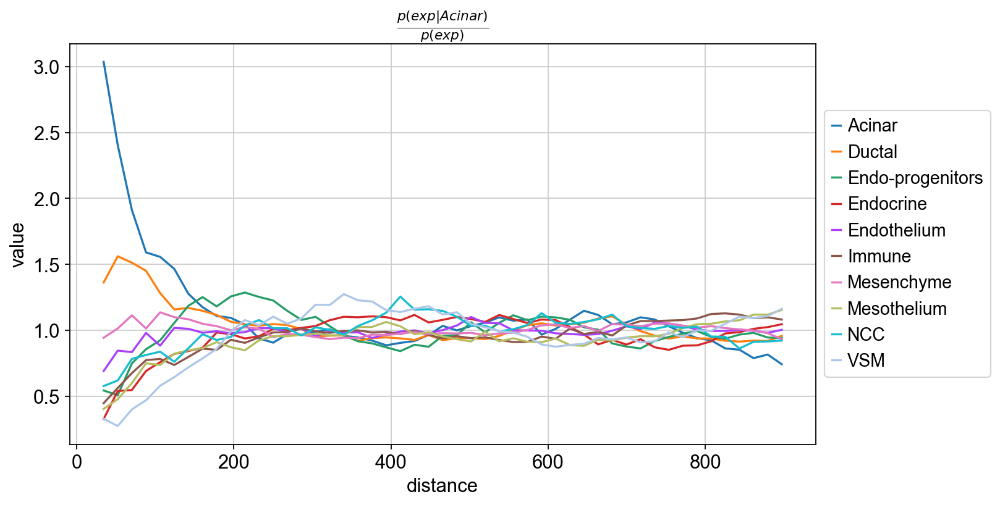

In [316]:
#This plots another statistic to analyze coocurrence. 

sq.gr.co_occurrence(adata, cluster_key="Tangram_annotation", interval=50)
sq.pl.co_occurrence(
    adata,
    cluster_key="Tangram_annotation",
    clusters="Acinar",#Change the clusters
    figsize=(10, 5)
)

In [317]:
results_Tangram_file = '{}/Anndata_Tangram_objects/{}_Tangram.h5ad'.format(path_Outputs, Sample)
adata.write(results_Tangram_file)

# Merging of pciSeq
Here I merge all datasetes coming out from pciSeq.
This part is to consolidate results from each stage. Run this part only when you have run all the samples of one stage. 
Remember to switch the single cell when you run different stages. 


In [22]:
#This will show all the files in the folder
pciseq_files=os.listdir("{}/Anndata_pciseq_objects".format(path_Outputs))
pciseq_files

['E12.5_11_predicted.h5ad',
 'E12.5_9_predicted.h5ad',
 'E12.5_6_predicted.h5ad',
 'E12.5_7_predicted.h5ad']

In [23]:
#This will select the files you want to merge to consolidate. 
indicesE12=[0,1,2,5,8,10,11,12,13]#In python fisr element of a list is 0!
indicesE14 = [14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29]
pciseq_files=[pciseq_files[idex] for idex in indicesE12]#Select the incicesE12 or indicesE14
pciseq_files

IndexError: list index out of range

[2023-03-24 11:10:41] INFO    (ipkernel.py:422) Exception in execute request:
---------------------------------------------------------------------------
IndexError                                Traceback (most recent call last)
/var/folders/3_/mb_s2xx93qj4w9d29npf9xs40000gn/T/ipykernel_59347/3683188572.py in <module>
      2 indicesE12=[0,1,2,5,8,10,11,12,13]#In python fisr element of a list is 0!
      3 indicesE14 = [14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29]
----> 4 pciseq_files=[pciseq_files[idex] for idex in indicesE12]#Select the incicesE12 or indicesE14
      5 pciseq_files

/var/folders/3_/mb_s2xx93qj4w9d29npf9xs40000gn/T/ipykernel_59347/3683188572.py in <listcomp>(.0)
      2 indicesE12=[0,1,2,5,8,10,11,12,13]#In python fisr element of a list is 0!
      3 indicesE14 = [14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29]
----> 4 pciseq_files=[pciseq_files[idex] for idex in indicesE12]#Select the incicesE12 or indicesE14
      5 pciseq_files

IndexError: list index out of 

In [118]:
from anndata import AnnData
pciseq_andatas=[]
for file in pciseq_files:
    adata_pci=sc.read_h5ad("{}/{}".format(path_pciSeq, file))
    adata_pci.obs["sample"]=file
    pciseq_andatas.append(adata_pci)



pciseq_concat = ad.concat(pciseq_andatas, join="outer", fill_value=0)

tg.pp_adatas(scdata, pciseq_concat, genes=None)
ad_map = tg.map_cells_to_space(scdata,
    pciseq_concat,
    device='cpu',num_epochs=500,
    mode='clusters',
    cluster_label="cluster_label"                           
    # device='cuda:0',
)

tg.project_cell_annotations(ad_map, pciseq_concat, annotation="cluster_label")

batches = pciseq_concat.obs['sample'].unique().tolist()

alldata = []
for batch in batches:
    alldata.append(pciseq_concat[pciseq_concat.obs['sample'] == batch,])
    
    

annotation_list = list(pd.unique(scdata.obs['cluster_label']))
for i in range(len(alldata)):
    name=alldata[i].obs["sample"][0]
    tg.plot_cell_annotation_sc(alldata[i], annotation_list,perc=0.02, scale_factor=1, spot_size= 45, x='x', y='y')
    result = alldata[i].obsm["tangram_ct_pred"].idxmax(axis=1)
    alldata[i].obs["Tangram_annotation"]=result.to_numpy()
    plt.savefig('{}/Tangram_probabilities/{}_TangramClusters_integrated.tif'.format(path_Outputs, name))

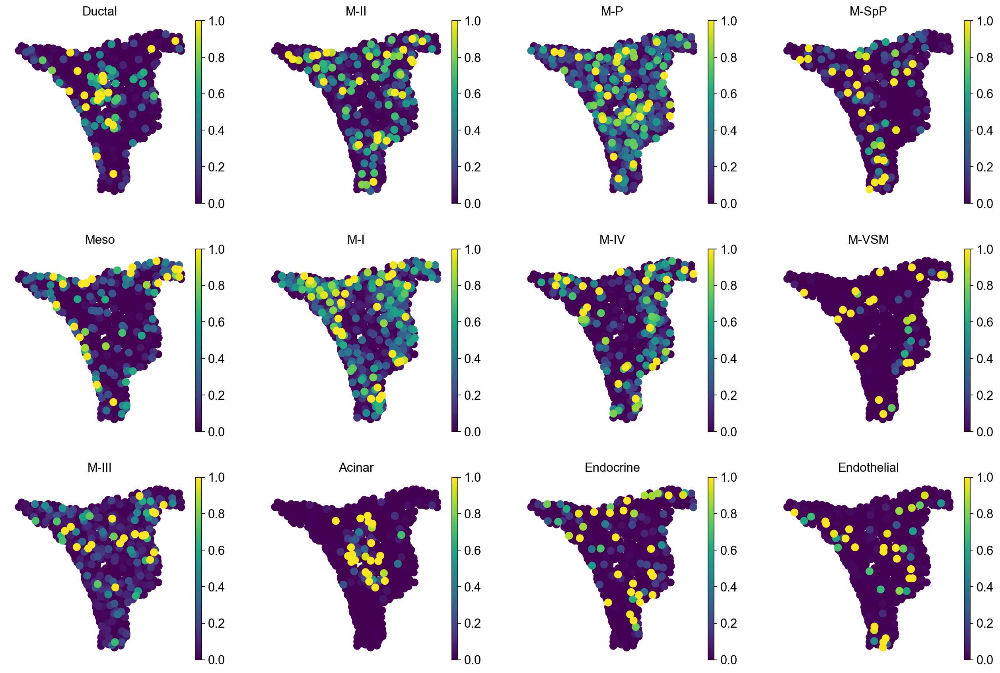

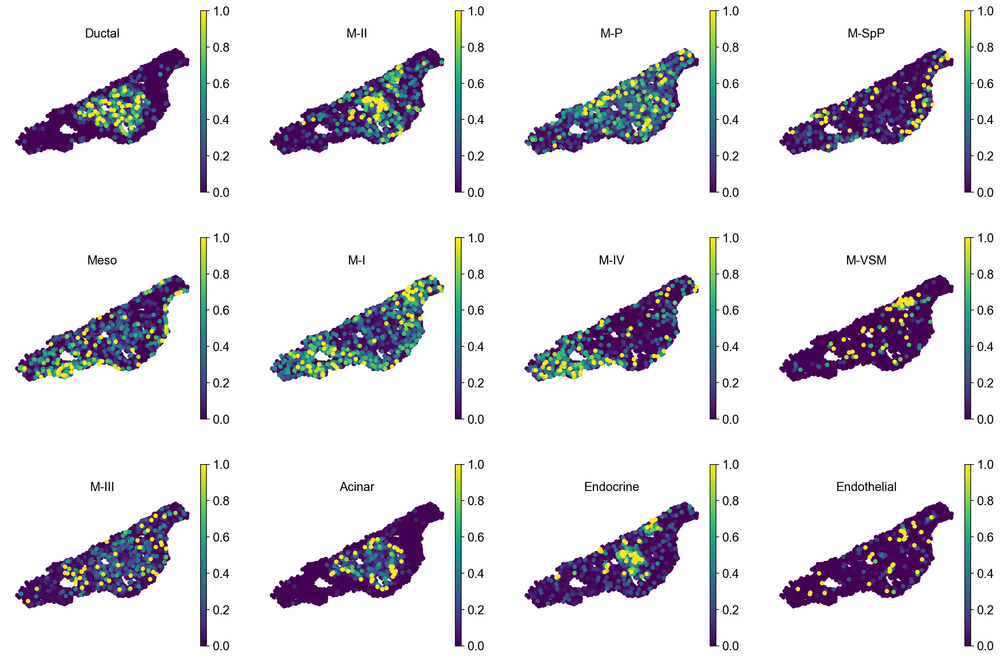

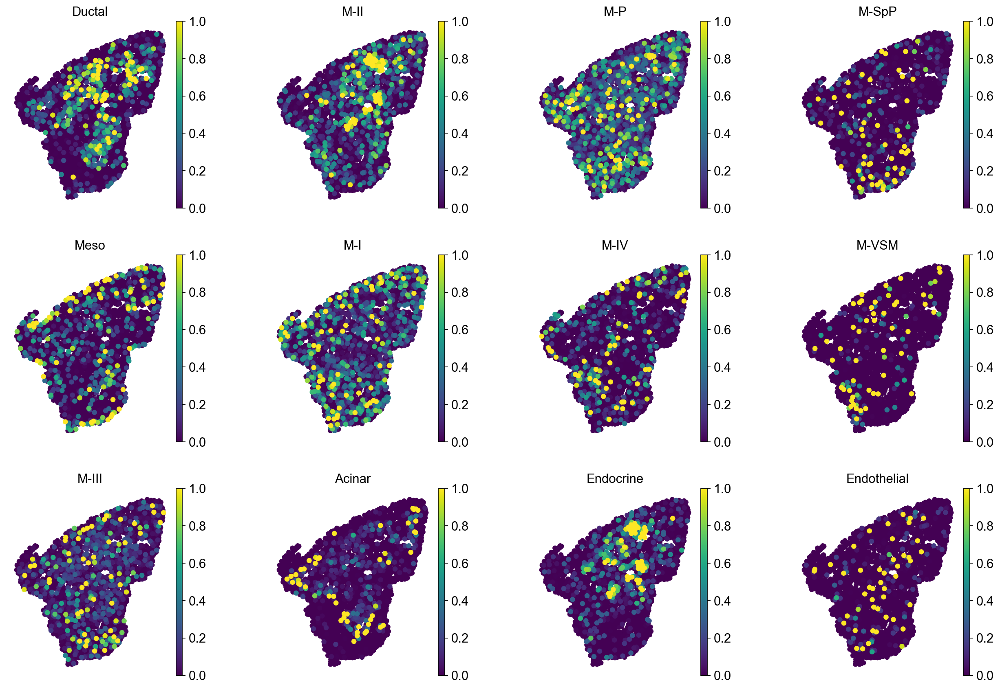

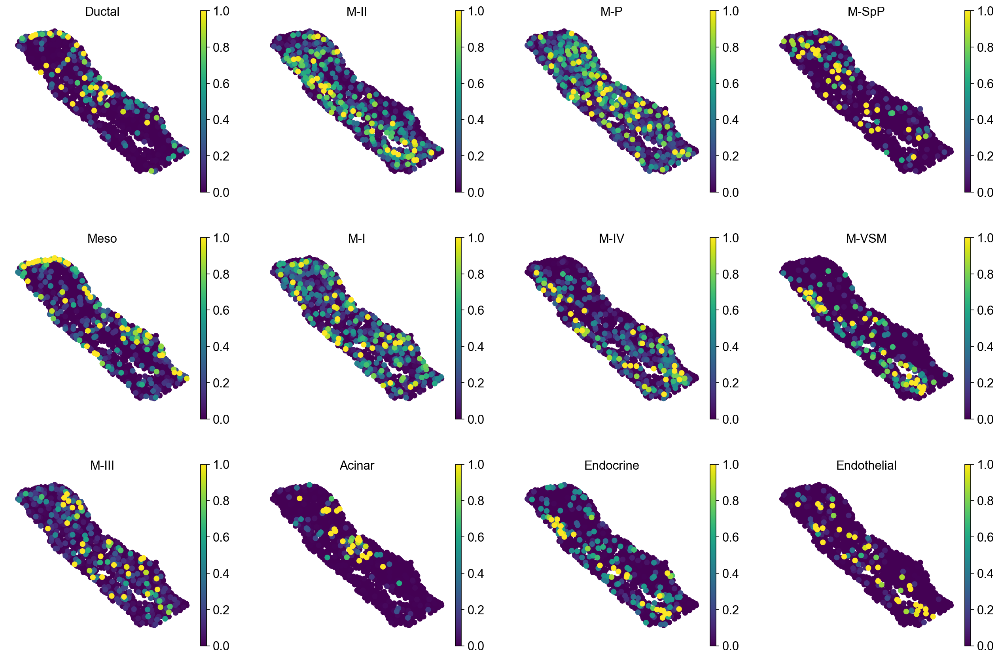

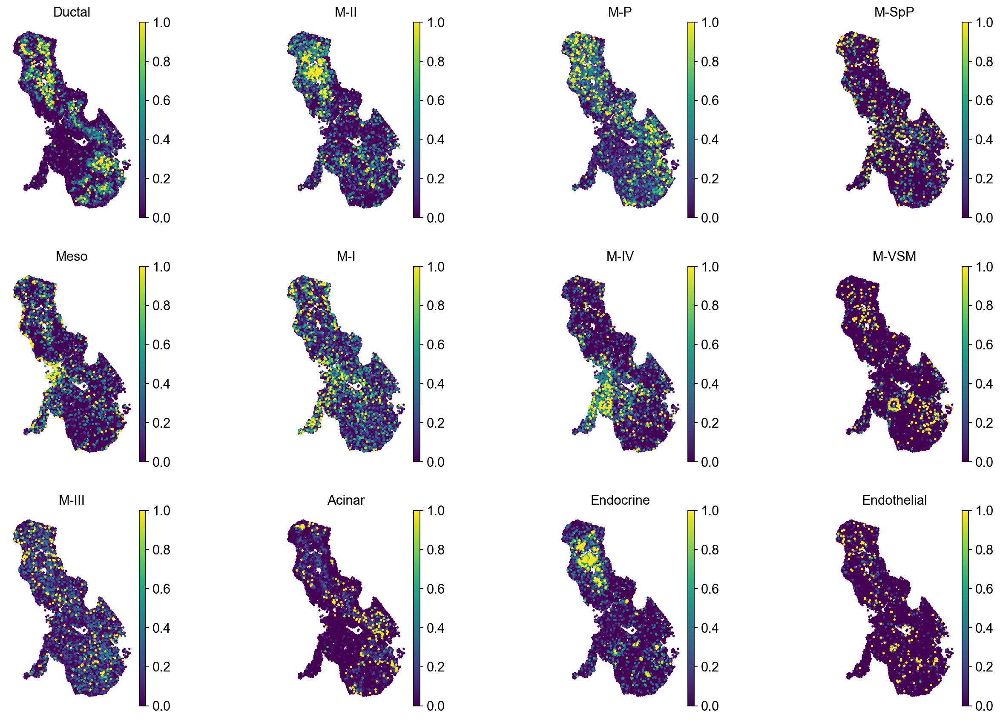

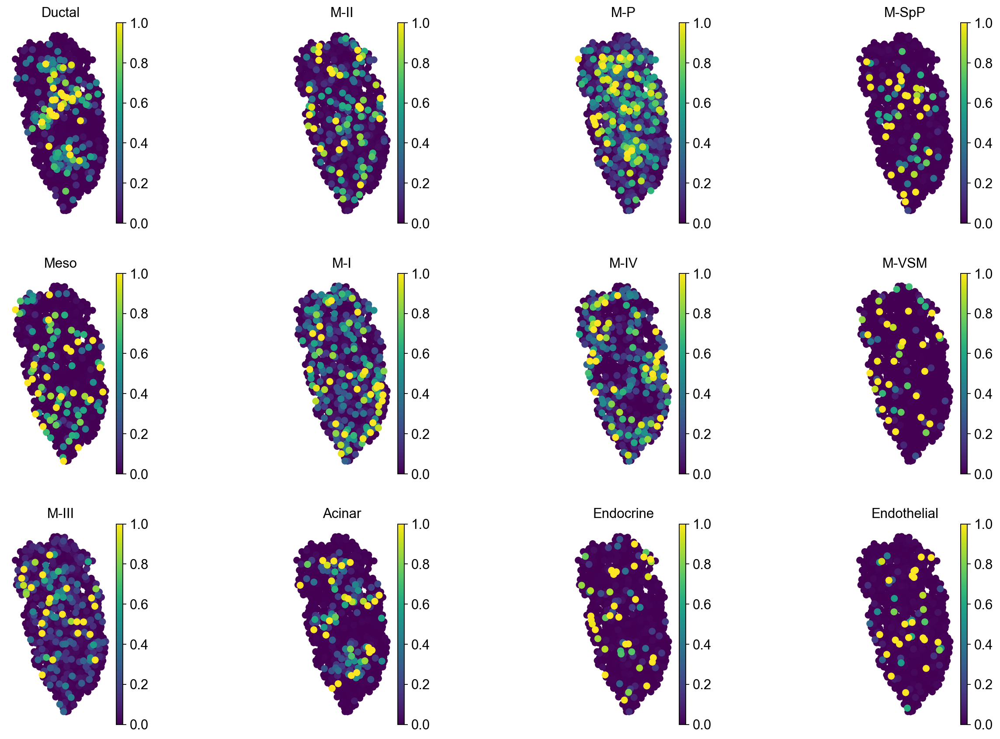

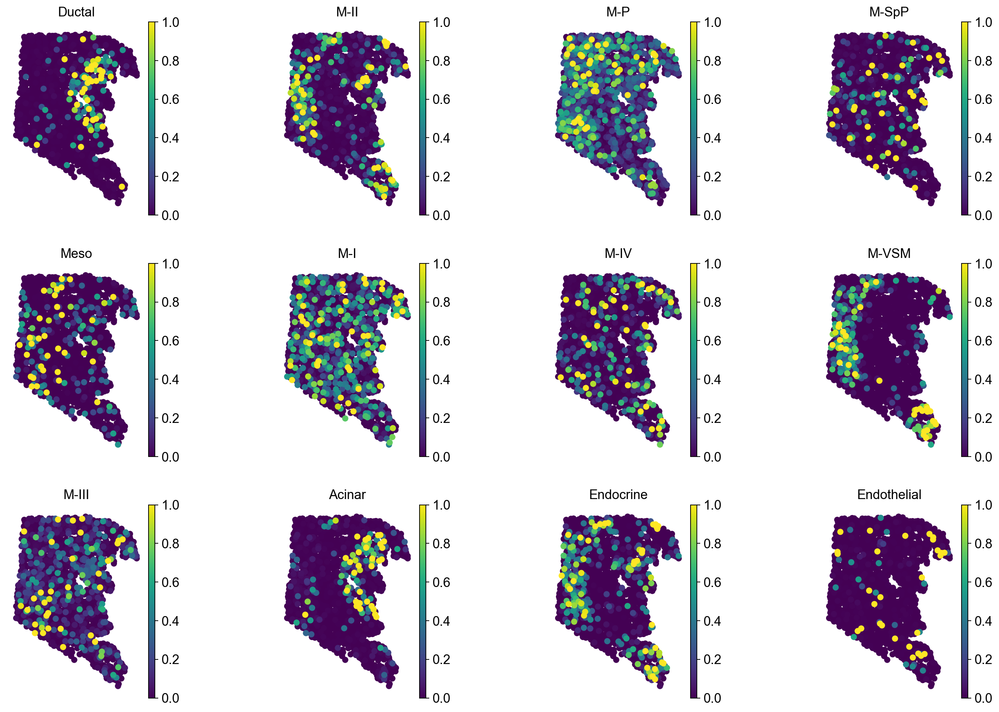

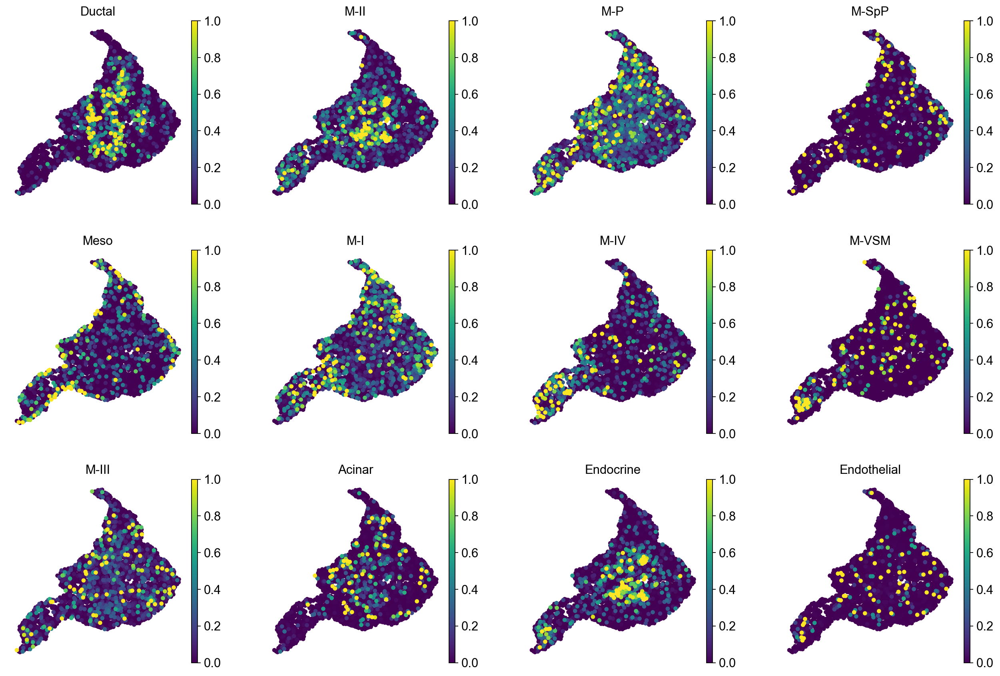

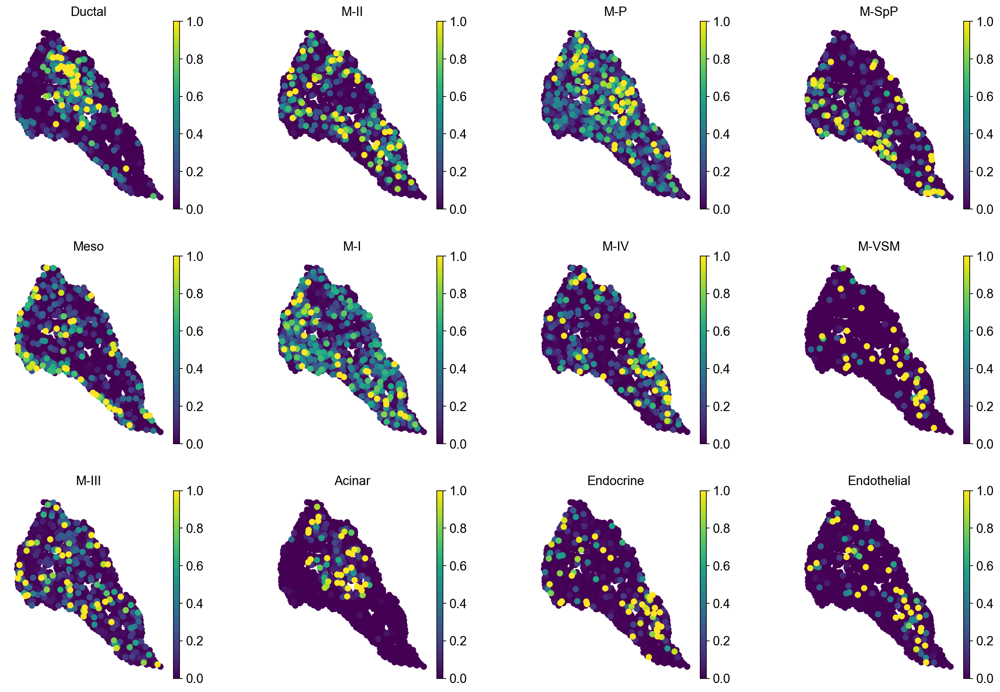

In [122]:
pciseq_andatas2=[]
for i in range(len(batches)):
    object_adata=alldata[i]
    object_adata.obs["x"]=object_adata.obs["x"]+(i*10000)
    object_adata.obs["y"]=object_adata.obs["y"]+(i*10000)
    pciseq_andatas2.append(object_adata)


from anndata import AnnData
pciseq_concat2 = ad.concat(pciseq_andatas2, join="outer", fill_value=0)

pciseq_concat2.obsm["spatial"][:,1]=pciseq_concat2.obs["y"]
pciseq_concat2.obsm["spatial"][:,0]=pciseq_concat2.obs["x"]

pciseq_concat2.obs['Tangram_annotation'] = pciseq_concat2.obs["Tangram_annotation"].astype('category')

Creating graph using `generic` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:01)
Calculating neighborhood enrichment using `1` core(s)


  0%|          | 0/1000 [00:00<?, ?/s]

Adding `adata.uns['Tangram_annotation_nhood_enrichment']`
Finish (0:00:06)


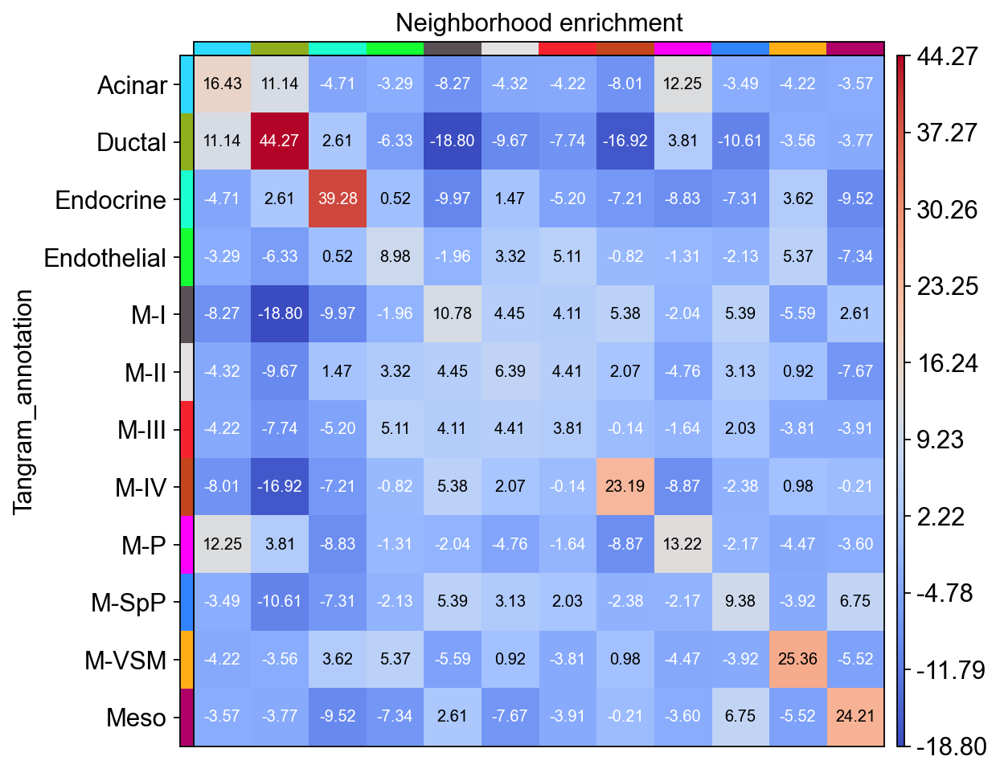

In [126]:
sq.gr.spatial_neighbors(pciseq_concat2, coord_type="generic", radius=200, delaunay=True)
sq.gr.nhood_enrichment(pciseq_concat2, cluster_key="Tangram_annotation")
kwargs={"size":9}
sq.pl.nhood_enrichment(pciseq_concat2, cluster_key="Tangram_annotation", cmap="coolwarm", annotate=True, **kwargs, palette=my_cmap2)

plt.tight_layout()
plt.savefig("{}/Individual_neigh/E12.5_Integrated_Tangram_Neigbourhood_bwr.tif".format(paht_Outputs))###Change this for E14

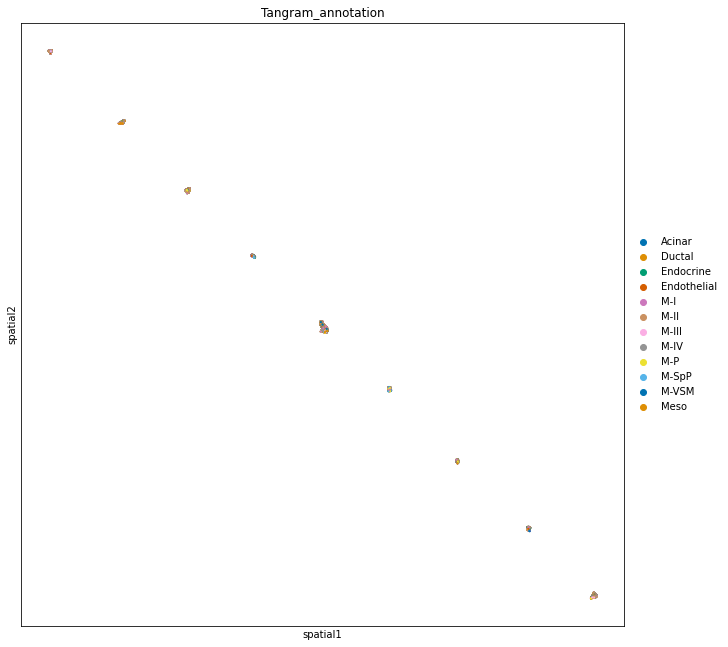

In [75]:
#Ignore this


my_cmap = matplotlib.colors.ListedColormap(sns.color_palette("colorblind", 12).as_hex())
#plt.figure(figsize=(1500/_dpi, 1500/_dpi), dpi=_dpi)

sq.pl.spatial_scatter(pciseq_concat2, color="Tangram_annotation", shape=None, figsize=(10, 10), palette=my_cmap, size=5)
plt.grid(False)

plt.show()